In [206]:
%load_ext autoreload
%autoreload 2

import optuna
import pandas as pd
import lightgbm as lgb
import matplotlib.pyplot as plt
import shap
import numpy as np
import scipy
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_auc_score
from steps.load_data import load_train_data, load_test_data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

from utils.model import predict, load_model, Metrics, save_model, lgb_booster_to_model, load_model, save_model, load_model

SEED = 42

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [207]:
from utils.pipeline import Pipeline, PipelineStep

from steps.set_missings import set_missings, drop_fraud
from utils.helpers import reduce_mem_usage
from steps.load_data import load_train_data, load_test_data
from steps.feature_selection import feature_selection
from steps.dpi_features import generate_test_dpi_feature, generate_train_dpi_feature
from steps.bnum_features import generate_test_bnum_feature, generate_train_bnum_feature
from steps.fe_features import generate_test_fe_feature, generate_train_fe_feature


def remove_abon_id(df):
    return df.drop("abon_id", axis=1)


transform_train_pipeline = Pipeline(
    "TRANSFORM_TRAIN",
    [
        # Load data
        PipelineStep(load_train_data),
        PipelineStep(set_missings),
        PipelineStep(reduce_mem_usage),
        # New features
        PipelineStep(generate_train_fe_feature),
        PipelineStep(generate_train_dpi_feature),
        PipelineStep(generate_train_bnum_feature),
        PipelineStep(drop_fraud),
        # Feature selection
        PipelineStep(remove_abon_id),
        PipelineStep(feature_selection),
    ],
)

transform_test_pipeline = Pipeline(
    "TRANSFORM_TEST",
    [
        # Load data
        PipelineStep(load_test_data),
        PipelineStep(set_missings),
        PipelineStep(reduce_mem_usage),
        # New features
        PipelineStep(generate_test_fe_feature),
        PipelineStep(generate_test_dpi_feature),
        PipelineStep(generate_test_bnum_feature),
        # Feature selection
        PipelineStep(remove_abon_id),
        PipelineStep(feature_selection),
    ],
)

In [208]:
train_data = transform_train_pipeline.run()

print("Shape:", train_data.shape)

2024-07-07 21:47:38 - Running pipeline: TRANSFORM_TRAIN (0:57:49)
2024-07-07 21:47:38 - 0. Running step: load_train_data (0:57:49)
2024-07-07 21:47:38 - 1. Running step: set_missings (0:57:49)
2024-07-07 21:47:40 - 2. Running step: reduce_mem_usage (0:57:52)
2024-07-07 21:47:41 - 3. Running step: generate_train_fe_feature (0:57:53)


Mem. usage decreased to 226.02 Mb (75.5% reduction)


2024-07-07 21:47:42 - 4. Running step: generate_train_dpi_feature (0:57:54)
2024-07-07 21:47:42 - 5. Running step: generate_train_bnum_feature (0:57:54)
2024-07-07 21:47:43 - 6. Running step: drop_fraud (0:57:55)
2024-07-07 21:47:44 - 7. Running step: remove_abon_id (0:57:55)
2024-07-07 21:47:44 - 8. Running step: feature_selection (0:57:55)
2024-07-07 21:47:44 - 10. Done (0:57:55)


-----------------

Shape: (149998, 615)
Columns: Index(['device_brand_nan', 'voice_mts_in_dwork_part_td_mnt3',
       'data_3g_dou_std_mnt3', 'voice_in_kievstar_part_mea_total',
       'com_num_part_max_mnt3', 'conn_com_part_std_total', 'MV_Traf_3G_d_Mb',
       'voice_out_td_cnt_std_diff', 'voice_mts_in_dwork_part_std_total',
       'count_day_for_last_paym',
       ...
       'vodafone_act_call_dur_out', 'vodafone_act_cnt_sms_in',
       'vodafone_act_cnt_sms_out', 'vodafone_services_cnt_sms_in_sum',
       'vodafone_services_cnt_sms_in_sum_share',
       'vodafone_survey_cnt_sms_in_sum', 'vodafone_topic_call_cnt_out_sum',
       'vodafone_topic_call_cnt_out_sum_share',
       'vodafone_topic_call_dur_out_sum', 'target'],
      dtype='object', length=615)


In [219]:
import pickle

cache_key = "cache/train_data_pipeline.pkl"

with open(cache_key, "wb") as f:
    pickle.dump(train_data, f)

with open(cache_key, "rb") as f:
    train_data = pickle.load(f)

In [209]:
test_data = transform_test_pipeline.run()

print("Shape:", test_data.shape)

2024-07-07 21:47:46 - Running pipeline: TRANSFORM_TEST (0:57:58)
2024-07-07 21:47:46 - 0. Running step: load_test_data (0:57:58)
2024-07-07 21:47:46 - 1. Running step: set_missings (0:57:58)
2024-07-07 21:47:49 - 2. Running step: reduce_mem_usage (0:58:01)
2024-07-07 21:47:50 - 3. Running step: generate_test_fe_feature (0:58:01)


Mem. usage decreased to 225.88 Mb (75.5% reduction)


2024-07-07 21:47:50 - 4. Running step: generate_test_dpi_feature (0:58:02)
2024-07-07 21:47:51 - 5. Running step: generate_test_bnum_feature (0:58:02)
2024-07-07 21:47:51 - 6. Running step: remove_abon_id (0:58:03)
2024-07-07 21:47:51 - 7. Running step: feature_selection (0:58:03)
2024-07-07 21:47:52 - 9. Done (0:58:03)


-----------------

Shape: (150000, 615)
Columns: Index(['device_brand_nan', 'voice_mts_in_dwork_part_td_mnt3',
       'data_3g_dou_std_mnt3', 'voice_in_kievstar_part_mea_total',
       'com_num_part_max_mnt3', 'conn_com_part_std_total', 'MV_Traf_3G_d_Mb',
       'voice_out_td_cnt_std_diff', 'voice_mts_in_dwork_part_std_total',
       'count_day_for_last_paym',
       ...
       'vodafone_act_call_dur_out', 'vodafone_act_cnt_sms_in',
       'vodafone_act_cnt_sms_out', 'vodafone_services_cnt_sms_in_sum',
       'vodafone_services_cnt_sms_in_sum_share',
       'vodafone_survey_cnt_sms_in_sum', 'vodafone_topic_call_cnt_out_sum',
       'vodafone_topic_call_cnt_out_sum_share',
       'vodafone_topic_call_dur_out_sum', 'target'],
      dtype='object', length=615)


In [218]:
import pickle

cache_key = "cache/test_data_pipeline.pkl"

with open(cache_key, "wb") as f:
    pickle.dump(test_data, f)

with open(cache_key, "rb") as f:
    test_data = pickle.load(f)

In [205]:
# DEVICE_BRAND_COLUMNS = [
#     "device_brand_samsung",
#     "device_brand_nokia",
#     "device_brand_lenovo",
#     "device_brand_apple",
#     "device_brand_huawei",
#     "device_brand_lg",
#     "device_brand_xiaomi",
#     "device_brand_meizu",
#     "device_brand_prestigio",
#     "device_brand_sony",
#     "device_brand_other",
# ]

# dataframe = set_missings(load_train_data(""))

# dataframe[(dataframe[DEVICE_BRAND_COLUMNS].any(axis=1)) & dataframe.device_brand_nan == 1]

,Ama_rchrgmnt_sum_max_mnt1,content_clc_mea_mnt1,content_cnt_max_mnt1,voice_out_short_part_max_mnt1,voice_mts_in_nrest_part_std_mnt1,num_act_days_max_mnt1,sms_roam_clc_min_mnt1,voice_in_cmpttrs_avg_durmin_mnt1,com_num_part_mea_mnt1,pay_avg_mea_mnt1,...,MV_Traf_mn_out_v_Min,MV_DOU_OT,MV_SERV_Y_WO_AF,MV_Migr_To,MV_SERV_RLH,MV_DOU_PPM_VF,MV_DOU_Neg_Bal,MV_ot_total,target,abon_id


In [210]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler


def oversampling(train_data, size=0.6):
    train_x = train_data.drop(columns="target")
    train_y = train_data.target

    not_churn_data_count = train_data[train_data.target == 0].shape[0]

    not_churn_count_strategy = int(not_churn_data_count * size)
    churn_count_strategy = int(not_churn_data_count * size)

    rus = RandomUnderSampler(random_state=SEED, sampling_strategy={0: not_churn_count_strategy})
    train_x, train_y = rus.fit_resample(train_x, train_y)

    smote = SMOTE(random_state=SEED, sampling_strategy={0: not_churn_count_strategy, 1: churn_count_strategy})
    resampled_x, resampled_y = smote.fit_resample(train_x, train_y)

    return resampled_x, resampled_y


sub_train_x, sub_val_x, sub_train_y, sub_val_y = train_test_split(
    train_data.drop(columns="target"),
    train_data.target,
    test_size=0.2,
    random_state=SEED,
    stratify=train_data.target,
)

sub_train_data = sub_train_x.copy()
sub_train_data["target"] = sub_train_y

resampled_x, resampled_y = oversampling(sub_train_data, size=0.7)
all_resampled_x, all_resampled_y = oversampling(train_data, size=0.7)

In [211]:
model_params = {
    "random_state": 42,
    "seed": 42,
    "objective": "binary",
    "metric": "auc",
    "verbosity": -1,
    "boosting_type": "gbdt",
    "feature_pre_filter": False,
    "n_jobs": -1,
    "lambda_l1": 8,
    "lambda_l2": 5,
    "learning_rate": 0.02,
    "num_leaves": 50,
    "feature_fraction": 0.6803603979260223,
    "bagging_fraction": 0.6735621254996546,
    "max_depth": 12,
    "min_child_samples": 30,
    "n_estimators": 350,
    "drop_rate": 0.2,
}

In [ ]:
# dtrain = lgb.Dataset(train_x, label=train_y)
# dvalid = lgb.Dataset(val_x, label=val_y, reference=dtrain)

# model = lgb.train(model_params, dtrain, valid_sets=[dvalid])

In [212]:
# model_params.pop("early_stopping_rounds")

model_cls = lgb.LGBMClassifier(**model_params)

model_cls = model_cls.fit(all_resampled_x, all_resampled_y)

In [213]:
import sklearn.metrics

features = list(all_resampled_x.columns)

threshold = 0.5

train_X = sub_train_x[resampled_x.columns]
train_y_true = sub_train_y

train_y_pred_proba = model_cls.booster_.predict(train_X)
train_y_pred = (train_y_pred_proba >= threshold).astype(int)

print("ROC AUC:", roc_auc_score(train_y_true, train_y_pred_proba))
print("F1 Score:", sklearn.metrics.f1_score(train_y_true, train_y_pred, pos_label=1))

val_X = sub_val_x[resampled_x.columns]
val_y_true = sub_val_y

val_y_pred_proba = model_cls.booster_.predict(sub_val_x)
val_y_pred = (val_y_pred_proba >= threshold).astype(int)

print("VAL ROC AUC:", roc_auc_score(sub_val_y, val_y_pred_proba))
print("VAL F1 Score:", sklearn.metrics.f1_score(sub_val_y, val_y_pred, pos_label=1))

Metrics().call(sub_val_y, val_y_pred, val_y_pred_proba)

ROC AUC: 0.9209120072522736
F1 Score: 0.5142721968143826
VAL ROC AUC: 0.9184739305172046
VAL F1 Score: 0.505062902730899

Metrics
AUC: 0.918
Matthews Correlation Coefficient: 0.486
Classification Report:
              precision    recall  f1-score   support

         0.0       0.96      0.98      0.97     28083
         1.0       0.61      0.43      0.51      1917

    accuracy                           0.95     30000
   macro avg       0.79      0.71      0.74     30000
weighted avg       0.94      0.95      0.94     30000



(0.9184739305172046,
 '              precision    recall  f1-score   support\n\n         0.0       0.96      0.98      0.97     28083\n         1.0       0.61      0.43      0.51      1917\n\n    accuracy                           0.95     30000\n   macro avg       0.79      0.71      0.74     30000\nweighted avg       0.94      0.95      0.94     30000\n')

In [214]:
test_X = test_data[resampled_x.columns]
test_y_true = test_data.target

test_y_pred_proba = model_cls.booster_.predict(test_X)
test_y_pred = (test_y_pred_proba >= 0.5).astype(int)

Metrics().call(test_y_true, test_y_pred, test_y_pred_proba)


Metrics
AUC: 0.898
Matthews Correlation Coefficient: 0.460
Classification Report:
              precision    recall  f1-score   support

         0.0       0.96      0.98      0.97    140597
         1.0       0.60      0.40      0.48      9403

    accuracy                           0.95    150000
   macro avg       0.78      0.69      0.72    150000
weighted avg       0.94      0.95      0.94    150000



(0.8978610733348606,
 '              precision    recall  f1-score   support\n\n         0.0       0.96      0.98      0.97    140597\n         1.0       0.60      0.40      0.48      9403\n\n    accuracy                           0.95    150000\n   macro avg       0.78      0.69      0.72    150000\nweighted avg       0.94      0.95      0.94    150000\n')

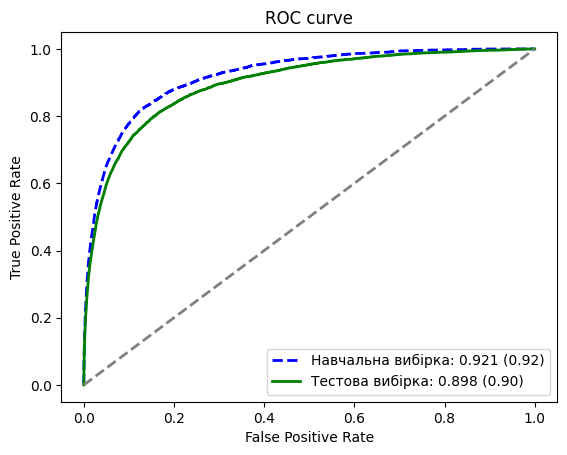

In [215]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc


def plot_roc_curve(y_train, y_val, y_test):
    fpr1, tpr1, _ = roc_curve(*y_train)
    roc_auc1 = auc(fpr1, tpr1)

    fpr2, tpr2, _ = roc_curve(*y_val)
    roc_auc2 = auc(fpr2, tpr2)

    fpr3, tpr3, _ = roc_curve(*y_test)
    roc_auc3 = auc(fpr3, tpr3)

    plt.figure()
    plt.plot(
        fpr1, tpr1, color="blue", lw=2, label=f"Навчальна вибірка: {roc_auc1:.3f} ({roc_auc1:.2f})", linestyle="--"
    )
    # plt.plot(fpr2, tpr2, color="red", lw=2, label=f"Валідаційна вибірка: {roc_auc2:.3f} ({roc_auc2:.2f})")
    plt.plot(fpr3, tpr3, color="green", lw=2, label=f"Тестова вибірка: {roc_auc3:.3f} ({roc_auc3:.2f})")
    plt.plot([0, 1], [0, 1], color="grey", lw=2, linestyle="--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC curve")
    plt.legend(loc="lower right")
    plt.show()


plot_roc_curve(
    (train_y_true, train_y_pred_proba), (val_y_true, val_y_pred_proba), (test_y_true, test_y_pred_proba)
)

In [216]:
save_model(model_cls, "BEST_LightGbmV2_pipeline_p060_r040_0898auc", list(resampled_x.columns))

Save BEST_LightGbmV2_pipeline_p060_r040_0898auc


'BEST_LightGbmV2_pipeline_p060_r040_0898auc'

In [217]:
model_cls, features = load_model("BEST_LightGbmV2_pipeline_p060_r040_0898auc.pickle")

In [220]:
from sklearn.calibration import CalibratedClassifierCV

calibrated_model_platt = CalibratedClassifierCV(estimator=model_cls, method="isotonic", cv="prefit")

calibrated_model_platt.fit(train_data[resampled_x.columns], train_data.target)

CalibratedClassifierCV(cv='prefit',
                       estimator=LGBMClassifier(bagging_fraction=0.6735621254996546,
                                                drop_rate=0.2,
                                                feature_fraction=0.6803603979260223,
                                                feature_pre_filter=False,
                                                lambda_l1=8, lambda_l2=5,
                                                learning_rate=0.02,
                                                max_depth=12, metric='auc',
                                                min_child_samples=30,
                                                n_estimators=350, n_jobs=-1,
                                                num_leaves=50,
                                                objective='binary',
                                                random_state=42, seed=42,
                                                verbosity=-1),
                       method='isotonic')

In [224]:
from sklearn.metrics import brier_score_loss, log_loss

X = train_data[resampled_x.columns]
y_true = train_data.target

y_pred_proba_calibr = calibrated_model_platt.predict_proba(X)[:, 1]
y_pred_callibr = (y_pred_proba_calibr >= 0.5).astype(int)

y_predict = model_cls.booster_.predict(X)

print("Brier score before Isotonic calibration: ", brier_score_loss(y_true, y_predict))
print("Brier score after Isotonic calibration: ", brier_score_loss(y_true, y_pred_proba_calibr))
print("Log loss before Isotonic calibration: ", log_loss(y_true, y_predict))
print("Log loss after Isotonic calibration: ", log_loss(y_true, y_pred_proba_calibr))

Metrics().call(y_true, y_pred_callibr, y_pred_proba_calibr)

Brier score before Isotonic calibration:  0.0400879946101368
Brier score after Isotonic calibration:  0.03887232624578327
Log loss before Isotonic calibration:  0.14881691650509143
Log loss after Isotonic calibration:  0.13923150955404417

Metrics
AUC: 0.921
Matthews Correlation Coefficient: 0.480
Classification Report:
              precision    recall  f1-score   support

         0.0       0.96      0.99      0.97    140413
         1.0       0.70      0.36      0.48      9585

    accuracy                           0.95    149998
   macro avg       0.83      0.67      0.72    149998
weighted avg       0.94      0.95      0.94    149998



(0.9209064305830256,
 '              precision    recall  f1-score   support\n\n         0.0       0.96      0.99      0.97    140413\n         1.0       0.70      0.36      0.48      9585\n\n    accuracy                           0.95    149998\n   macro avg       0.83      0.67      0.72    149998\nweighted avg       0.94      0.95      0.94    149998\n')

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve

X = train_data[resampled_x.columns]
y_true = train_data.target

# Get learning curve data
train_sizes, train_scores, val_scores = learning_curve(
    lgb.LGBMClassifier(**model_params),
    X,
    y_true,
    cv=10,
    n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 5),
    scoring="roc_auc",
)

In [ ]:
def build_learning_curve_plt(train_sizes, train_scores, val_scores):
    # Calculate mean and standard deviation for training and validation scores
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    val_scores_mean = np.mean(val_scores, axis=1)
    val_scores_std = np.std(val_scores, axis=1)

    # Витягнення даних з найвищими середніми оцінками
    best_train_index = np.argmax(train_scores_mean)
    best_test_index = np.argmax(train_scores_mean)

    best_train_size = train_sizes[best_train_index]
    best_train_score_mean = train_scores_mean[best_train_index]
    best_train_score_std = train_scores_std[best_train_index]

    # Plot learning curve
    plt.figure()
    plt.title("Learning Curve")
    plt.xlabel("Training examples")
    plt.ylabel("ROC-AUC Score")
    plt.grid()

    plt.fill_between(
        train_sizes,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.1,
        color="r",
    )
    plt.fill_between(
        train_sizes, val_scores_mean - val_scores_std, val_scores_mean + val_scores_std, alpha=0.1, color="g"
    )
    plt.plot(train_sizes, train_scores_mean, "o-", color="r", label="Training score")
    plt.plot(train_sizes, val_scores_mean, "o-", color="g", label="Cross-validation score")

    plt.legend(loc="best")
    plt.show()

In [ ]:
build_learning_curve_plt(train_sizes, train_scores, val_scores)

In [226]:
from sklearn.metrics import accuracy_score, f1_score
import matplotlib.pyplot as plt


def find_threshold(y_test, y_pred_proba):
    # Define a range of possible thresholds
    thresholds = np.linspace(0, 1, 100)
    accuracies = []

    # Calculate accuracy for each threshold
    for threshold in thresholds:
        y_pred = (y_pred_proba >= threshold).astype(int)
        score = 0.8 * accuracy_score(y_test, y_pred) + 0.2 * f1_score(y_test, y_pred, pos_label=1)
        accuracies.append(score)

    # Find the threshold that provides the highest accuracy
    max_accuracy_index = np.argmax(accuracies)
    optimal_threshold = thresholds[max_accuracy_index]

    print(f"Optimal Threshold for Maximum Score: {optimal_threshold}")
    print(f"Maximum Score: {accuracies[max_accuracy_index]}")

    # Plotting accuracy vs threshold
    plt.plot(thresholds, accuracies, label="Accuracy")
    plt.scatter(
        thresholds[max_accuracy_index],
        accuracies[max_accuracy_index],
        marker="o",
        color="red",
        label="Best Threshold",
    )
    plt.title("Score (Accuracy + F1) vs. Threshold")
    plt.xlabel("Threshold")
    plt.ylabel("Score")
    plt.legend()
    plt.grid(True)
    plt.show()

    return optimal_threshold

Optimal Threshold for Maximum Score: 0.4040404040404041
Maximum Score: 0.8648556364598861


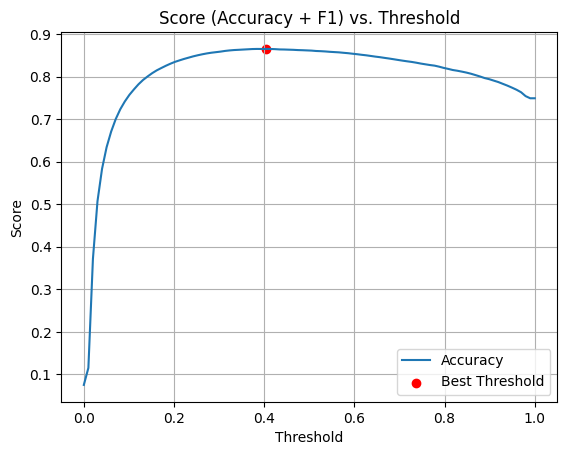

In [236]:
X = train_data[resampled_x.columns]
y_true = train_data.target

y_pred_proba_calibr = model_cls.booster_.predict(X)

optimal_threshold = find_threshold(y_true, y_pred_proba_calibr)

In [ ]:
# test_X = test_data[resampled_x.columns]
# test_y_true = test_data.target

# test_y_pred_proba = model_cls.booster_.predict(test_X)
# test_y_pred = (test_y_pred_proba >= optimal_threshold).astype(int)

# Metrics().call(test_y_true, test_y_pred, test_y_pred_proba)

# print("model_cls.booster_Columns count ", len(resampled_x.columns))


Metrics
AUC: 0.898
Matthews Correlation Coefficient: 0.475
Classification Report:
              precision    recall  f1-score   support

         0.0       0.96      0.97      0.97    140597
         1.0       0.54      0.47      0.50      9403

    accuracy                           0.94    150000
   macro avg       0.75      0.72      0.74    150000
weighted avg       0.94      0.94      0.94    150000



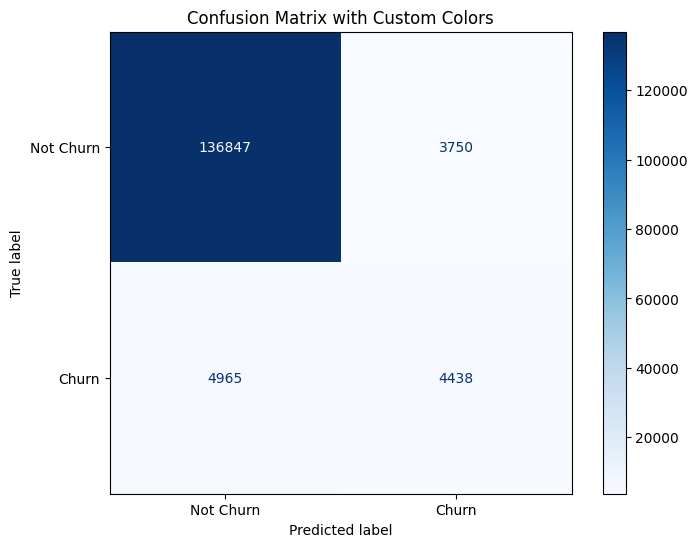

In [237]:
X = test_data[features]
y_true = test_data.target

y_pred_proba = model_cls.booster_.predict(X)
y_pred = (y_pred_proba >= optimal_threshold).astype(int)

Metrics().call(y_true, y_pred, y_pred_proba)

classes = ["Not Churn", "Churn"]

cm = confusion_matrix(y_true, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(cmap="Blues", ax=ax)
plt.title("Confusion Matrix with Custom Colors")
plt.show()

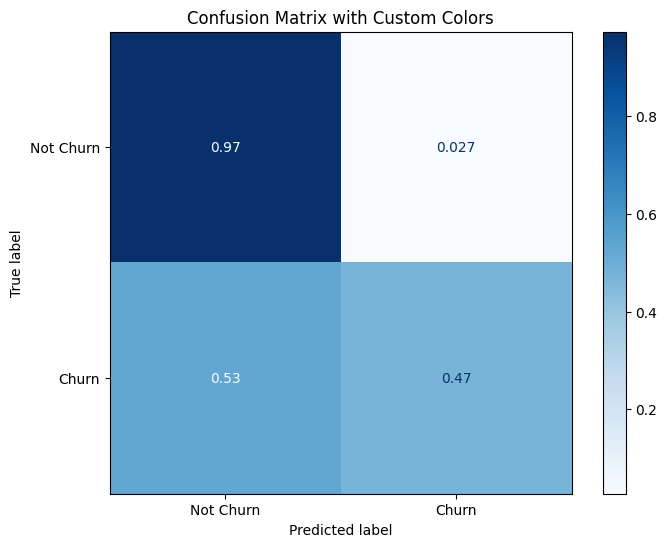

In [238]:
cm = confusion_matrix(y_true, y_pred, normalize="true")

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(cmap="Blues", ax=ax)
plt.title("Confusion Matrix with Custom Colors")
plt.show()

In [240]:
import plotly.express as px

px_y_pred_proba = model_cls.booster_.predict(X)


pred_df = pd.DataFrame(
    {
        "y_pred_proba": px_y_pred_proba.astype(np.float32),
        "Churn": y_true.values.astype(np.int32),
    }
)

fig = px.histogram(
    pred_df,
    x="y_pred_proba",
    color="Churn",
    marginal="box",
    nbins=100,
    title="Distribution of predicted probabilities",
    color_discrete_map={0: "blue", 1: "red"},
)

fig.update_layout(bargap=0.1, xaxis_title="Predicted probability", yaxis_title="Count", legend_title="Class")

fig.update_layout(width=1200, height=600)

fig.show()

In [241]:
import plotly.express as px

pred_df = pd.DataFrame(
    {
        "y_pred_proba": px_y_pred_proba[y_true == 1],
        "Churn": y_true[y_true == 1].values,
    }
)

fig = px.histogram(
    pred_df,
    x="y_pred_proba",
    color="Churn",
    marginal="box",
    nbins=100,
    title="Distribution of predicted probabilities (Churn class)",
    color_discrete_map={0: "blue", 1: "red"},
)

fig.update_layout(
    bargap=0.1, xaxis_title="Predicted probability (Churn class)", yaxis_title="Count", legend_title="Class"
)

fig.update_layout(width=1000, height=600)

fig.show()

In [242]:
import plotly.express as px

pred_df = pd.DataFrame(
    {
        "y_pred_proba": y_pred_proba[y_true == 0],
        "Churn": y_true[y_true == 0].values,
    }
)

fig = px.histogram(
    pred_df,
    x="y_pred_proba",
    color="Churn",
    marginal="box",
    nbins=100,
    title="Distribution of predicted probabilities (NOT Churn class)",
    color_discrete_map={0: "blue", 1: "red"},
)

fig.update_layout(
    bargap=0.1, xaxis_title="Predicted probability (NOT Churn class)", yaxis_title="Count", legend_title="Class"
)

fig.update_layout(width=1200, height=600)

fig.show()

In [243]:
importances = model_cls.booster_.feature_importance(importance_type="gain")
importance_df = pd.DataFrame(list(zip(features, importances)), columns=["Feature", "Importance"])

# Report
feature_importances = importance_df.sort_values(by="Importance", ascending=False)
feature_importances = feature_importances[feature_importances.Importance > 85]

feature_importances.Feature

254                  num_act_days_min_mnt1
174                       device_sim_count
19                              active_ppm
504                  num_act_days_min_mnt3
34                    num_act_days_mea_wk1
                      ...                 
579    bank_companies_cnt_sms_in_sum_share
137                  bs_delte_mb_change_tp
413                data_3g_tar_vol_td_mnt3
483               clc_no_vas_roam_std_mnt3
456                   data_3g_dou_std_diff
Name: Feature, Length: 423, dtype: object

In [252]:
import plotly.express as px

fig = px.bar(feature_importances[:100], x="Importance", y="Feature", title="Feature Importances")
fig.update_layout(yaxis={"categoryorder": "total ascending"}, width=800, height=2000)
fig.show()

In [253]:
explainer = shap.TreeExplainer(model_cls)
shap_values = explainer(test_data[features])

In [254]:
shap_importance = pd.DataFrame(
    list(zip(features, np.abs(shap_values.values).mean(axis=0))), columns=["feature", "importance"]
).sort_values(by="importance", ascending=False)

shap_features = shap_importance[shap_importance.importance > 0.05]

shap_features

,feature,importance
254,num_act_days_min_mnt1,0.365301
19,active_ppm,0.322427
504,num_act_days_min_mnt3,0.287749
174,device_sim_count,0.257713
507,voice_mts_in_dwork_part_min_mnt1,0.211363
463,loc_market_share,0.178303
237,loc_is_obl_center,0.174761
425,device_type_smartphone,0.134666
34,num_act_days_mea_wk1,0.121402
270,device_has_lte,0.119143


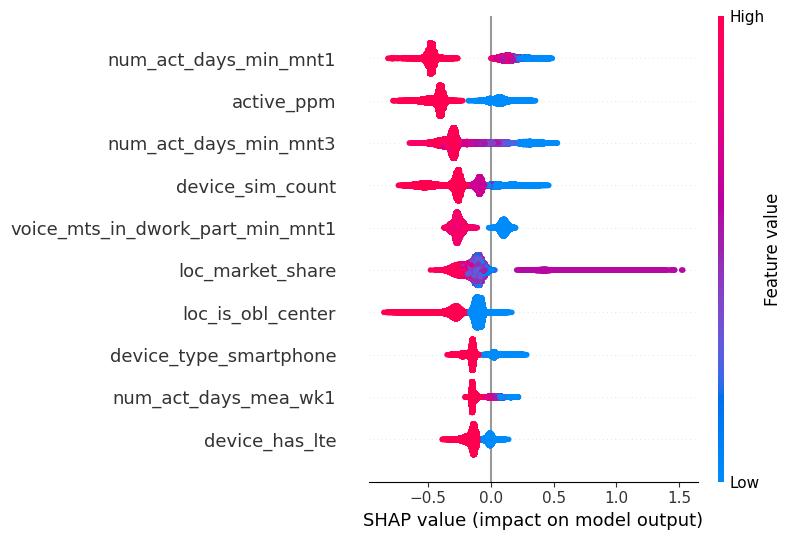

In [340]:
shap.summary_plot(shap_values, test_data[features], max_display=10)

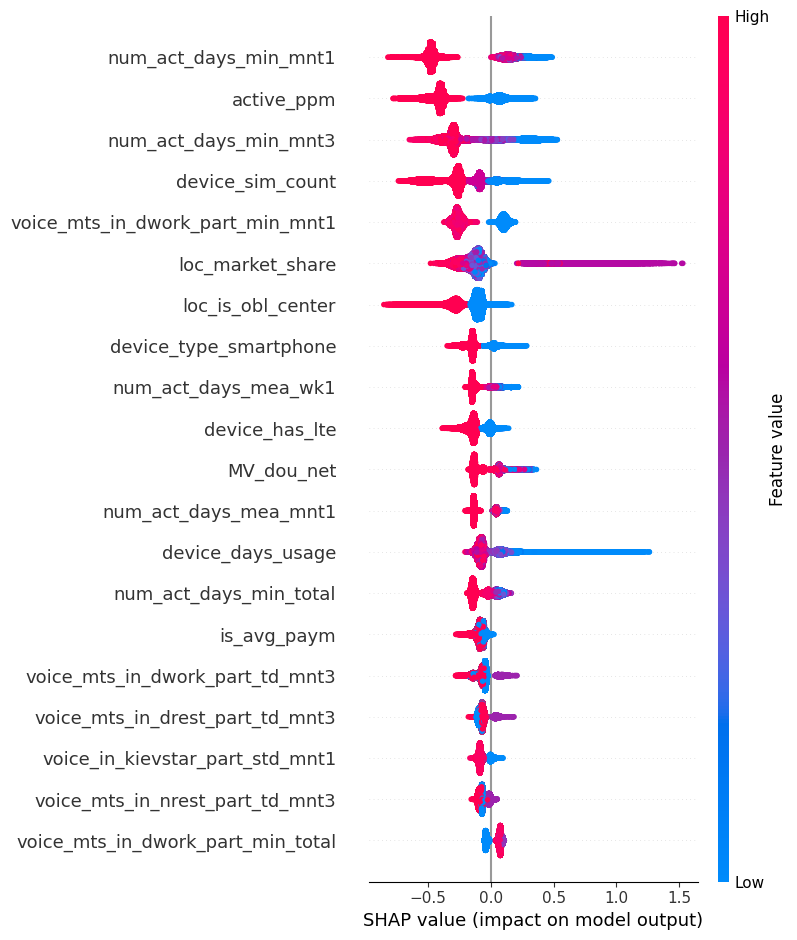

In [339]:
shap.summary_plot(shap_values, test_data[features])

In [310]:
feature_importances_nams = feature_importances["Feature"].values


def render_shap_plot(feature_name):
    shap.dependence_plot(feature_name, shap_values.values, test_data[features])

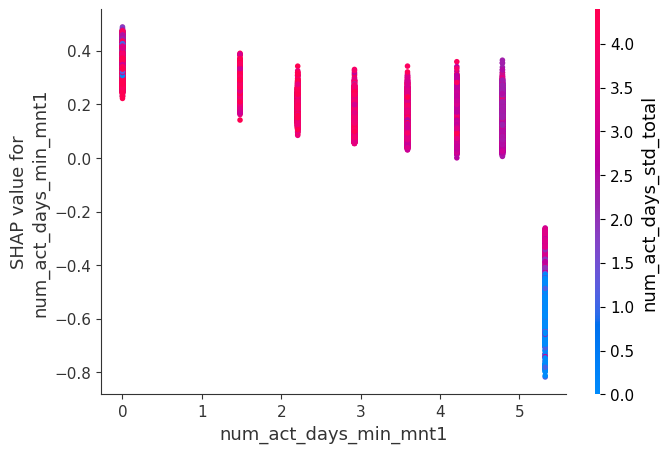

In [311]:
render_shap_plot(feature_importances_nams[0])

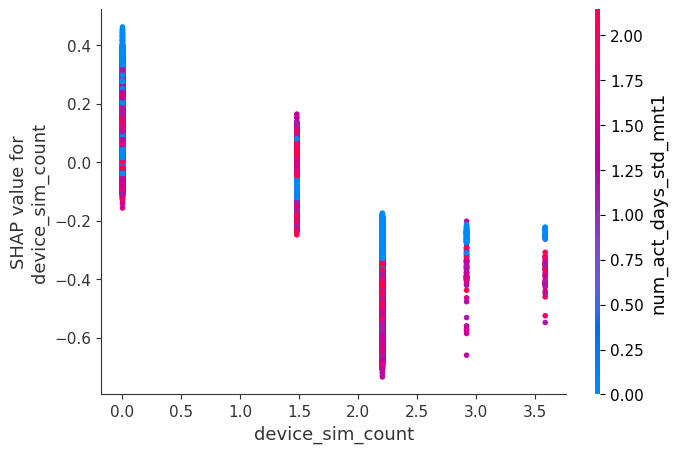

In [312]:
render_shap_plot(feature_importances_nams[1])

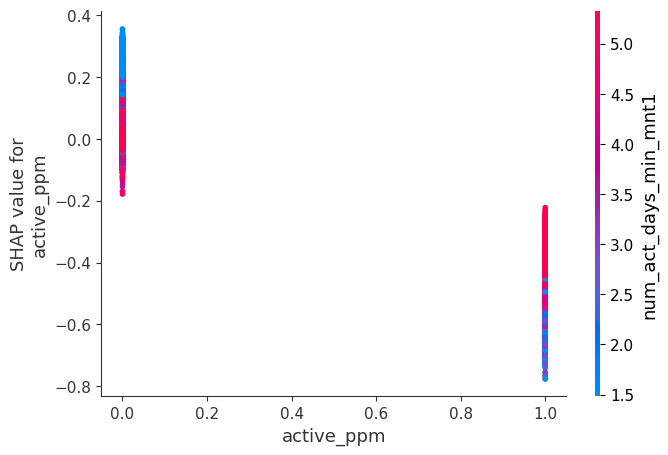

In [313]:
render_shap_plot(feature_importances_nams[2])

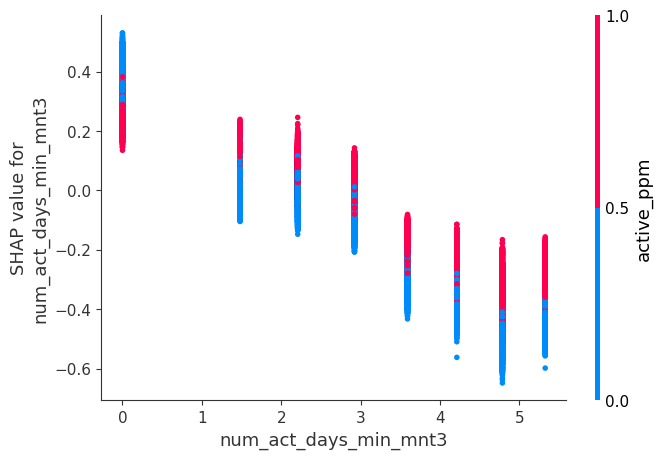

In [314]:
render_shap_plot(feature_importances_nams[3])

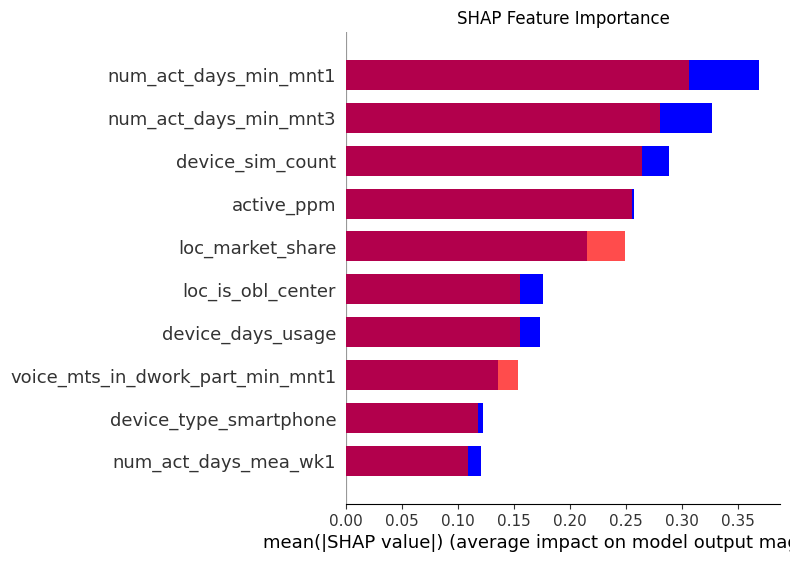

In [396]:
X_test = test_data[features]
y_test = test_data.target

# Розділення SHAP значень за класами
shap_values_0 = shap_values.values[y_test == 0]
shap_values_1 = shap_values.values[y_test == 1]

plt.figure()
shap.summary_plot(shap_values_0, X_test[y_test == 0], plot_type="bar", show=False, color="blue", max_display=10)

# Overlay the plot for the second class (red with opacity)
shap.summary_plot(shap_values_1, X_test[y_test == 1], plot_type="bar", show=False, color="red", max_display=10)

# Adjust the transparency of the red bars
for patch in plt.gca().patches:
    if patch.get_facecolor() == (1.0, 0.0, 0.0, 1.0):
        patch.set_facecolor((1.0, 0.0, 0.0, 0.7))

plt.title("SHAP Feature Importance")
plt.show()

In [ ]:
# Калібрація моделі. Аналіз

In [263]:
df_pred_train = pd.DataFrame(columns=["pred", "pred_proba", "target"])

X = train_data[features]
y_true = train_data.target

y_pred_proba = model_cls.booster_.predict(X)
y_pred = (y_pred_proba >= optimal_threshold).astype(int)

df_pred_train["pred"] = y_pred
df_pred_train["pred_proba"] = y_pred_proba
df_pred_train["target"] = y_true.astype(int)

data_base = df_pred_train[["pred_proba", "target"]]

data_base = data_base.sort_values(by="pred_proba")
data_base.index = np.arange(1, len(data_base) + 1)
data_base["prediction"] = data_base.index / len(data_base)

data_base

,pred_proba,target,prediction
1,0.005902,0.0,0.000007
2,0.005968,0.0,0.000013
3,0.006029,0.0,0.000020
4,0.006062,0.0,0.000027
5,0.006063,0.0,0.000033
...,...,...,...
149994,0.988281,1.0,0.999973
149995,0.988325,1.0,0.999980
149996,0.988371,1.0,0.999987
149997,0.988876,1.0,0.999993


In [281]:
df = data_base[data_base.prediction > 0.5]

print("Churned: ", df[df.target == 1].shape[0])
print("Not Churned: ", df[df.target == 0].shape[0])

Churned:  9164
Not Churned:  65834


In [282]:
# розбиваємо базу по топ %
base_rate = (1 - data_base["prediction"]) * 100
base_rate = base_rate.apply(np.floor) + 1

# розбиваємо базу по 5% - якщо потрібно по-іншому - замінюємо 5 на інше число
base_rate = (base_rate / 5).apply(np.ceil)
base_rate = base_rate * 5

data_base["rate"] = base_rate
# base_rate.value_counts(dropna=False)

In [297]:
df = data_base[data_base.rate <= 5]

print("Churned: ", df[df.target == 1].shape[0])
print("Not Churned: ", df[df.target == 0].shape[0])

Churned:  4195
Not Churned:  3305


In [301]:
# формуємо фінальну таблицю, зберігаємо
data_stat = data_base[["pred_proba", "target", "rate"]].groupby(["target", "rate"]).count()
data_stat.reset_index(inplace=True)

data_stat = data_stat.pivot(index="rate", columns="target", values="pred_proba")
data_stat = data_stat.fillna(0)

data_stat

target,0.0,1.0
rate,,
5.0,3305.0,4195.0
10.0,5719.0,1781.0
15.0,6508.0,992.0
20.0,6868.0,632.0
25.0,7022.0,478.0
30.0,7178.0,321.0
35.0,7234.0,266.0
40.0,7289.0,211.0
45.0,7343.0,157.0


In [302]:
data_stat.cumsum()

# Покриття: 43,7% | (4195 * 100) / 9585
# Концентрація (Конверсія): 55,9% | 4195 / (4195 + 3305)

target,0.0,1.0
rate,,
5.0,3305.0,4195.0
10.0,9024.0,5976.0
15.0,15532.0,6968.0
20.0,22400.0,7600.0
25.0,29422.0,8078.0
30.0,36600.0,8399.0
35.0,43834.0,8665.0
40.0,51123.0,8876.0
45.0,58466.0,9033.0


<Axes: title={'center': 'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

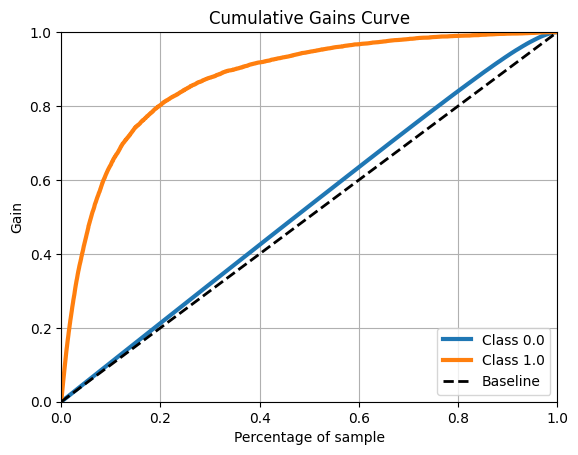

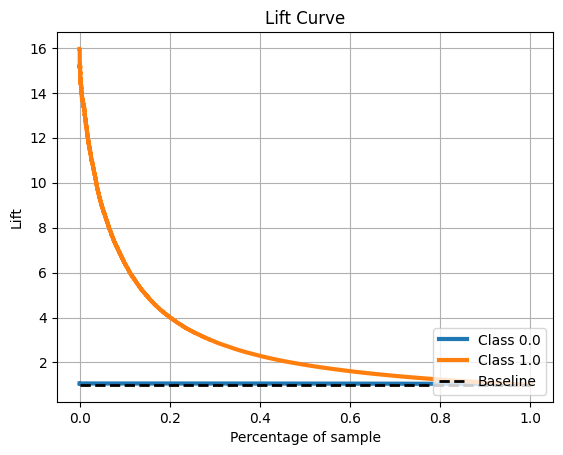

In [331]:
import pandas as pd
import numpy as np
import scikitplot as skplt

y_true = test_data.target
y_pred_prob = model_cls.predict_proba(test_data[features])

skplt.metrics.plot_cumulative_gain(y_true, y_pred_prob)
skplt.metrics.plot_lift_curve(y_true, y_pred_prob)

In [336]:
def get_treshold(y_test, y_pred):
    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    gmeans = np.sqrt(tpr * (1 - fpr))
    ix = np.argmax(gmeans)
    return thresholds[ix]


y_train_true = train_data.target
y_train_pred_prob = model_cls.predict_proba(train_data[features])[:, 1]

y_test_true = test_data.target
y_test_pred_prob = model_cls.predict_proba(test_data[features])[:, 1]

train_threshold = get_treshold(y_train_true, y_train_pred_prob)
test_threshold = get_treshold(y_test_true, y_test_pred_prob)

print("Treshold (Train): ", train_threshold)
print("Treshold (Test): ", test_threshold)
print("Diff: ", train_threshold - test_threshold)

Treshold (Train):  0.11729093171303855
Treshold (Test):  0.09645699071574936
Diff:  0.02083394099728919
